# Analysis of Airbnb data for Washington, D.C.

Note:
There are several functions that I will be performing to clean the data to a standard that I can start using it in my analytical questions.  Additionally, since I will be performing some basic geospatial analysis, I will need to keep track of which datafames are geospatial and not.  Thus, I will be giving all geospatially enabled dataframes a `_geo` prefix to help with this task.

In [1]:
import pandas as pd
import geopandas as gpd
import contextily as ctx
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error, classification_report
import seaborn as sns
import statsmodels.api as sm

from utils.utils import bar_chart, cat_map, chor_map, clean_bath_text

#setting the display options for Pandas to ensure we see all the fields in our dataset
pd.options.display.max_rows = 100
pd.set_option('display.max_columns', None)
%matplotlib inline

# Section 1.  Data Gathering, Assessment, and  Cleaning

## Section 1.a. Gathering

Loading the datasets that I obtained from [DC Government](https://opendata.dc.gov/datasets/neighborhood-clusters?geometry=-78.323%2C38.707%2C-75.706%2C39.081) and [Inside Airbnb](http://insideairbnb.com/get-the-data.html)

In [2]:
dc_nbrhds_geo = gpd.read_file('data/dcgis/Neighborhood_Clusters.geojson')
abnb_dc = pd.read_csv('data/airbnb/listings_dc_08112020.csv')

## Section 1.b. Assessment

Take a look at the dataset to have a better understanding of the data we are dealing with and if we need to do any cleaning steps.

### Assessing DC Neighborhood Dataset

The neighborhood data that I obtained from DC Government website looks fairly clean, and we will only be utilizing this data to map out the Airbnb listings in a nice clean fashion.

It appears that there are no missing values, so we shouldn't have to do any cleaning to this dataset...

In [3]:
dc_nbrhds_geo.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 46 entries, 0 to 45
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   OBJECTID      46 non-null     int64   
 1   WEB_URL       40 non-null     object  
 2   NAME          46 non-null     object  
 3   NBH_NAMES     46 non-null     object  
 4   Shape_Length  46 non-null     float64 
 5   Shape_Area    46 non-null     float64 
 6   TYPE          46 non-null     object  
 7   geometry      46 non-null     geometry
dtypes: float64(2), geometry(1), int64(1), object(4)
memory usage: 3.0+ KB


### Assessing the DC Neighborhood Dataset cont.

Taking a look at the values to assure they look formatted in a uniform method.

In [4]:
dc_nbrhds_geo.head()

,OBJECTID,WEB_URL,NAME,NBH_NAMES,Shape_Length,Shape_Area,TYPE,geometry
0,1,http://planning.dc.gov/,Cluster 39,"Congress Heights, Bellevue, Washington Highlands",10711.668010,4.886463e+06,Original,"POLYGON ((-76.99402 38.84520, -76.99471 38.845..."
1,2,http://planning.dc.gov/,Cluster 38,"Douglas, Shipley Terrace",8229.486324,2.367958e+06,Original,"POLYGON ((-76.97472 38.85287, -76.97499 38.853..."
2,3,http://planning.dc.gov/,Cluster 36,"Woodland/Fort Stanton, Garfield Heights, Knox ...",4746.344457,1.119573e+06,Original,"POLYGON ((-76.96877 38.86067, -76.96907 38.860..."
3,4,http://planning.dc.gov/,Cluster 27,"Near Southeast, Navy Yard",7286.968902,1.619167e+06,Original,"POLYGON ((-76.98726 38.87712, -76.98860 38.877..."
4,5,http://planning.dc.gov/,Cluster 32,"River Terrace, Benning, Greenway, Dupont Park",11251.012821,4.286254e+06,Original,"POLYGON ((-76.93760 38.88996, -76.93783 38.890..."


### Assessing the DC Neighborhood Dataset cont.

Since this dataset is loaded using GeoPandas we can plot a quick map to make sure that we will be able to visualize the data later in our analysis.

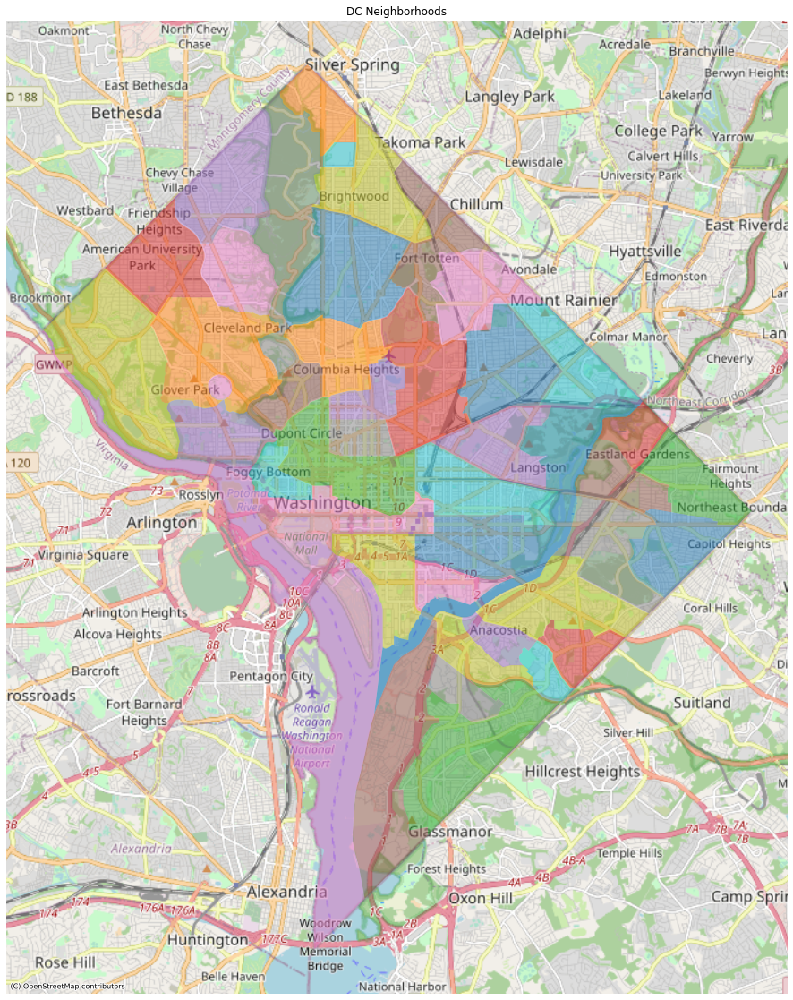

In [5]:
cat_map(dc_nbrhds_geo,'NBH_NAMES',title="DC Neighborhoods")

When plotting the data I can see my assessment was correct. The dataset from DC government is clean and I do now need to do any pre-processing steps before the analysis.

Lets hope I am as lucky with the Airbnb dataset :)

### Assessing Inside Airbnb Dataset for Washington, DC

The dataset from Inside Airbnb appears to be have a log of content.  74 columns worth, but there are several fields that are missing information.

In [6]:
abnb_dc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7440 entries, 0 to 7439
Data columns (total 74 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            7440 non-null   int64  
 1   listing_url                                   7440 non-null   object 
 2   scrape_id                                     7440 non-null   int64  
 3   last_scraped                                  7440 non-null   object 
 4   name                                          7439 non-null   object 
 5   description                                   7321 non-null   object 
 6   neighborhood_overview                         4921 non-null   object 
 7   picture_url                                   7440 non-null   object 
 8   host_id                                       7440 non-null   int64  
 9   host_url                                      7440 non-null   o

### Assessing Inside Airbnb Dataset for Washington, DC, cont.

There are several fields that I will need to clean up before I can use this data in my analysis.  Since I want answer the following quesitons:

1. Which DC Neighborhood has the highest average price per listing?
2. Which DC Neighborhood's Airbnb market is saturated?
3. Which DC Neighborhood has the highest rated listings?
4. Are there any other factors that I need to review before investing in a property?

I will need to clean up the `price` columns and it might be useful to have a good idea of how many bathrooms each listing provides for an independent variable in a Regression Analysis.

### Assessing Inside Airbnb Dataset for Washington, DC, cont.

From the analysis above I believe there are several fields that I can omit for my analysis.

In [7]:
abnb_dc.head()

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,3686,https://www.airbnb.com/rooms/3686,20201108173758,2020-11-08,Vita's Hideaway,IMPORTANT NOTES<br />* Carefully read and be s...,We love that our neighborhood is up and coming...,https://a0.muscache.com/pictures/61e02c7e-3d66...,4645,https://www.airbnb.com/users/show/4645,Vita,2008-11-26,"Washington D.C., District of Columbia, United ...","I am a literary scholar, teacher, poet, vegan ...",within a few hours,100%,100%,f,https://a0.muscache.com/im/users/4645/profile_...,https://a0.muscache.com/im/users/4645/profile_...,Anacostia,2,2,"['email', 'phone', 'reviews', 'jumio', 'offlin...",t,t,"Washington, District of Columbia, United States",Historic Anacostia,NaN,38.86177,-76.98966,Private room in house,Private room,1,NaN,1 private bath,1.0,1.0,"[""Hangers"", ""Garden or backyard"", ""Microwave"",...",$55.00,2,365,2,2,365,365,2.0,365.0,NaN,t,8,38,66,341,2020-11-08,73,2,0,2010-11-01,2020-09-19,92.0,9.0,9.0,10.0,10.0,8.0,9.0,NaN,f,2,0,2,0,0.60
1,3943,https://www.airbnb.com/rooms/3943,20201108173758,2020-11-08,Historic Rowhouse Near Monuments,Please contact us before booking to make sure ...,Our rowhouse is centrally located in the heart...,https://a0.muscache.com/pictures/432713/fab7dd...,5059,https://www.airbnb.com/users/show/5059,Vasa,2008-12-12,"Washington, District of Columbia, United States","We are a married couple in our 30's, living an...",within a few hours,100%,25%,f,https://a0.muscache.com/im/users/5059/profile_...,https://a0.muscache.com/im/users/5059/profile_...,Eckington,0,0,"['email', 'phone', 'reviews', 'kba']",t,t,"Washington, District of Columbia, United States","Edgewood, Bloomingdale, Truxton Circle, Eckington",NaN,38.91066,-77.00438,Private room in townhouse,Private room,2,NaN,1 shared bath,1.0,1.0,"[""Gas stove"", ""Hangers"", ""Garden or backyard"",...",$80.00,27,1125,27,27,1125,1125,27.0,1125.0,NaN,t,25,50,50,50,2020-11-08,429,0,0,2009-05-10,2018-08-07,96.0,10.0,10.0,10.0,10.0,9.0,9.0,NaN,f,2,0,2,0,3.06
2,4197,https://www.airbnb.com/rooms/4197,20201108173758,2020-11-08,Bedroom in DC 2 blocks to Metro,This is the middle bedroom upstairs in a resto...,"Our area, the Eastern Market neighborhood of C...",https://a0.muscache.com/pictures/5e2bd169-b14f...,5061,https://www.airbnb.com/users/show/5061,Sandra,2008-12-12,"Washington D.C., District of Columbia, United ...",I’m a California native who came to work for t...,NaN,NaN,95%,t,https://a0.muscache.com/im/pictures/user/ddd27...,https://a0.muscache.com/im/pictures/user/ddd27...,Capitol Hill,2,2,"['email', 'phone', 'facebook', 'reviews', 'kba']",t,t,"Washington, District of Columbia, United States","Capitol Hill, Lincoln Park",NaN,38.88791,-76.99668,Private room in house

After assessing the datasets that I gathered I will need to write a function to clean a few columns in the Inside Airbnb Dataset.

## Section 1.c. Cleaning

After assessing the datasets I will need to have to clean and reformat the `bathrooms` and `prices` columns.

### Cleaning `bathrooms` Column

Wrote a small function (located in `utils/utils.py`) to clean the bathroom field in the Airbnb dataset.  

```python
def clean_bath_text(x):
    """
    Cleanes the bathrooms_text field from AirBnB datasource.
    This has only been tested for data obtained from Washington DC.  For a new city you may need to update the list.
    
    x = is the input of the bathroom_text field.
    
    """
    if isinstance(x, str):
        return(x.replace("shared", '').replace("private", "").replace("baths", "").replace("bath", "").replace("Half-", "").replace("Shared half-", "").replace("Private half-", ""))
    return(x)

```

In [8]:
abnb_dc.bathrooms_text.head()

0      1 private bath
1       1 shared bath
2    1.5 shared baths
3       1 shared bath
4             3 baths
Name: bathrooms_text, dtype: object

The data formatting is not very helpful for analysis to see if the number of bathrooms at a listing will affect the price of the listing.  

In [9]:
abnb_dc['bathrooms'] = pd.to_numeric(abnb_dc['bathrooms_text'].apply(clean_bath_text))
abnb_dc.bathrooms.head()

0    1.0
1    1.0
2    1.5
3    1.0
4    3.0
Name: bathrooms, dtype: float64

So it looks like my function worked and now I a `float64` column with the number of bathrooms per listing.

### Cleaning `price` Column

It looks like cleaning the `price` column will be more straightforward than the `bathrooms` field.  I can utilize the Pandas `replace` function since the field's only issue is that it have the `$` (U.S. Dollar sign) in the column.

In [10]:
abnb_dc.price.head()

0    $55.00
1    $80.00
2    $75.00
3    $54.00
4    $99.00
Name: price, dtype: object

In [11]:
abnb_dc['price'] = abnb_dc['price'].replace( '[\$,)]','', regex=True ).astype(float)
abnb_dc.price.head()

0    55.0
1    80.0
2    75.0
3    54.0
4    99.0
Name: price, dtype: float64

### Cleaning new Analysis Dataframe

Not that the Airbnb listing dataset is clean and properly formatted for our purpose, I should create a new dataframe with the columns that I will use going forward. For reference purpose I'll pull the `info` to see what columns are availible for use...

In [12]:
abnb_dc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7440 entries, 0 to 7439
Data columns (total 74 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            7440 non-null   int64  
 1   listing_url                                   7440 non-null   object 
 2   scrape_id                                     7440 non-null   int64  
 3   last_scraped                                  7440 non-null   object 
 4   name                                          7439 non-null   object 
 5   description                                   7321 non-null   object 
 6   neighborhood_overview                         4921 non-null   object 
 7   picture_url                                   7440 non-null   object 
 8   host_id                                       7440 non-null   int64  
 9   host_url                                      7440 non-null   o

There is some good data in these columns but for my analysis I believe that the following fields will be utilized for my analysis of the questions...

In [13]:
keep_columns=['id',
              'neighbourhood_cleansed',
              'latitude',
              'longitude',
              'property_type',
              'room_type',
              'accommodates',
              'bathrooms',
              'bedrooms',
              'beds',
              'price',
              'minimum_nights',
              'maximum_nights',
              'number_of_reviews']

I believe these columns will be helpful in completing my analysis and the dataframe will be easier to handle going forward...

In [14]:
abnb_dc_subset = pd.DataFrame(abnb_dc[keep_columns])
abnb_dc_subset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7440 entries, 0 to 7439
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   id                      7440 non-null   int64  
 1   neighbourhood_cleansed  7440 non-null   object 
 2   latitude                7440 non-null   float64
 3   longitude               7440 non-null   float64
 4   property_type           7440 non-null   object 
 5   room_type               7440 non-null   object 
 6   accommodates            7440 non-null   int64  
 7   bathrooms               7428 non-null   float64
 8   bedrooms                6709 non-null   float64
 9   beds                    7406 non-null   float64
 10  price                   7440 non-null   float64
 11  minimum_nights          7440 non-null   int64  
 12  maximum_nights          7440 non-null   int64  
 13  number_of_reviews       7440 non-null   int64  
dtypes: float64(6), int64(5), object(3)
memor

Now this is better.  I was able to identify 14 out of 74 columns that will be used in my analysis and modeling.  However, we still have an issue that I need to address.  I have some missing values in `bathrooms` and `beds`.  Lucky for me there are not that many missing in these columns, roughly `9%` is missing in `beds` and less than `1%` for `bathrooms`.  To make sure we have a clean data set we will need to drop these missing rows (listings) from our Airbnb dataset to ensure that we can answer my questions as accuratly as possible.

In [15]:
abnb_dc_subset = abnb_dc_subset.dropna()
abnb_dc_subset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6673 entries, 0 to 7438
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   id                      6673 non-null   int64  
 1   neighbourhood_cleansed  6673 non-null   object 
 2   latitude                6673 non-null   float64
 3   longitude               6673 non-null   float64
 4   property_type           6673 non-null   object 
 5   room_type               6673 non-null   object 
 6   accommodates            6673 non-null   int64  
 7   bathrooms               6673 non-null   float64
 8   bedrooms                6673 non-null   float64
 9   beds                    6673 non-null   float64
 10  price                   6673 non-null   float64
 11  minimum_nights          6673 non-null   int64  
 12  maximum_nights          6673 non-null   int64  
 13  number_of_reviews       6673 non-null   int64  
dtypes: float64(6), int64(5), object(3)
memor

Since I want to perform geospatial analysis with this new subset, I will need to spatially enable the new dataframe that I'm creating, with help from GeoPandas. I will use the spatial reference of each listing (`latitude` & `longitude`) to create a geospatially enabled GeoDataframe.

In [16]:
abnb_dc_subset_geo = gpd.GeoDataFrame(abnb_dc_subset, crs={'init': 'epsg:4326'},geometry=gpd.points_from_xy(abnb_dc_subset.longitude,abnb_dc_subset.latitude))

Then provide a quick map to see if all of the listings are actually spatially within the Neighborhood...

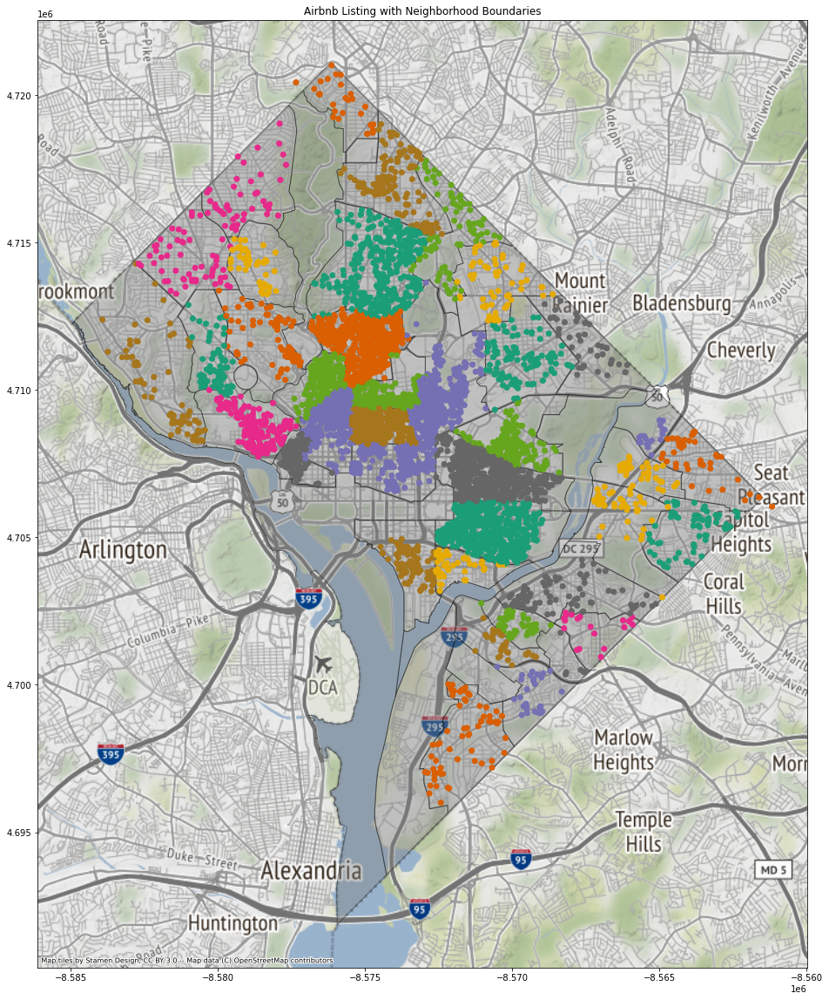

In [17]:
dc_webmerc = dc_nbrhds_geo.to_crs(epsg=3857)
abnb_webmerc = abnb_dc_subset_geo.to_crs(epsg=3857)
ax = dc_webmerc.plot(figsize = (20,20), alpha=0.4, color='gray', edgecolor='k')
abnb_webmerc.plot(ax=ax,categorical=True, column='neighbourhood_cleansed', cmap='Dark2')
ax.set(title="Airbnb Listing with Neighborhood Boundaries")
ctx.add_basemap(ax);

As you can see not all the listings sptial reference actually are actually within the boundaries of DC, and to fix this issue I will utilize GeoPandas `sjoin` (spatial join) to ensure I have a dataset that is completely within DC...

In [18]:
abnb_dc_subset_geo = gpd.sjoin(left_df=abnb_dc_subset_geo, right_df=dc_nbrhds_geo, how="inner", op="intersects")

Now lets see how many listings we lost with this cleaning process, and save the dataout as a geojson...

In [19]:
abnb_dc_subset_geo.to_file('data/abnb_dc_listing_geo.json', driver='GeoJSON')
abnb_dc_subset_geo.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 6671 entries, 0 to 6159
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   id                      6671 non-null   int64   
 1   neighbourhood_cleansed  6671 non-null   object  
 2   latitude                6671 non-null   float64 
 3   longitude               6671 non-null   float64 
 4   property_type           6671 non-null   object  
 5   room_type               6671 non-null   object  
 6   accommodates            6671 non-null   int64   
 7   bathrooms               6671 non-null   float64 
 8   bedrooms                6671 non-null   float64 
 9   beds                    6671 non-null   float64 
 10  price                   6671 non-null   float64 
 11  minimum_nights          6671 non-null   int64   
 12  maximum_nights          6671 non-null   int64   
 13  number_of_reviews       6671 non-null   int64   
 14  geometry        

So we lost 2 listings and gained some fields from the spatial join that I performed with the neighborhood boundaries

Finally, we have our final dataset for Airbnb listings in Washington, DC, and now we can move onto the analysis, modeling and visualization section of the project.

# Section 2. Analyzing, Modeling, and Visualizing

## Analysis Questions:

Now that I have a clean dataset for the geographic and listing data I can start performing the needed analysis to answer the questions I have formulated, which are the follow:

1. Which DC Neighborhood has the highest average price per listing?
2. Which DC Neighborhood's Airbnb market is saturated?
3. How well does the data predict Airbnb Listing Price?
4. Are there any other factors that I need to review before investing in a property?

## Analysis Dataframe Setup

But before I begin to try to answer these questions, I would like to have a freash reference of the data that I will be working by pulling in the `df.info()`

In [20]:
abnb_dc_subset_geo.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 6671 entries, 0 to 6159
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   id                      6671 non-null   int64   
 1   neighbourhood_cleansed  6671 non-null   object  
 2   latitude                6671 non-null   float64 
 3   longitude               6671 non-null   float64 
 4   property_type           6671 non-null   object  
 5   room_type               6671 non-null   object  
 6   accommodates            6671 non-null   int64   
 7   bathrooms               6671 non-null   float64 
 8   bedrooms                6671 non-null   float64 
 9   beds                    6671 non-null   float64 
 10  price                   6671 non-null   float64 
 11  minimum_nights          6671 non-null   int64   
 12  maximum_nights          6671 non-null   int64   
 13  number_of_reviews       6671 non-null   int64   
 14  geometry        

## Question 1: Which DC Neighborhood has the highest average price per listing?

So if was giving a client advise on where they should purchase an property to list on Airbnb then I really need to understand where the highest mean of listings are in the city.  For this analysis I decided to utilize the neighborhood boundaries for this analysis.

Thus, I am utilizing the Pandas `groupby` function to aggragate the mean `price` per `neighborhood`, and then sorting based on the values (price)...

In [21]:
abnb_dc_nbrhds_prc_mean = abnb_dc_subset_geo.groupby('neighbourhood_cleansed')['price'].mean()
abnb_dc_nbrhds_prc_mean.sort_values(ascending=False)

neighbourhood_cleansed
West End, Foggy Bottom, GWU                                                                          297.486301
Georgetown, Burleith/Hillandale                                                                      296.126374
Spring Valley, Palisades, Wesley Heights, Foxhall Crescent, Foxhall Village, Georgetown Reservoir    270.366197
Cathedral Heights, McLean Gardens, Glover Park                                                       234.071429
Southwest Employment Area, Southwest/Waterfront, Fort McNair, Buzzard Point                          231.034722
Downtown, Chinatown, Penn Quarters, Mount Vernon Square, North Capitol Street                        230.016287
Hawthorne, Barnaby Woods, Chevy Chase                                                                226.581395
Cleveland Park, Woodley Park, Massachusetts Avenue Heights, Woodland-Normanstone Terrace             221.013333
Capitol Hill, Lincoln Park                                                       

Any person who is familar with Washington, DC would not be surprised to see that the `neighborhoods` in North West section of the city are most of the higher priced listings.  To see it in a chart, I created a function to visualize the data....

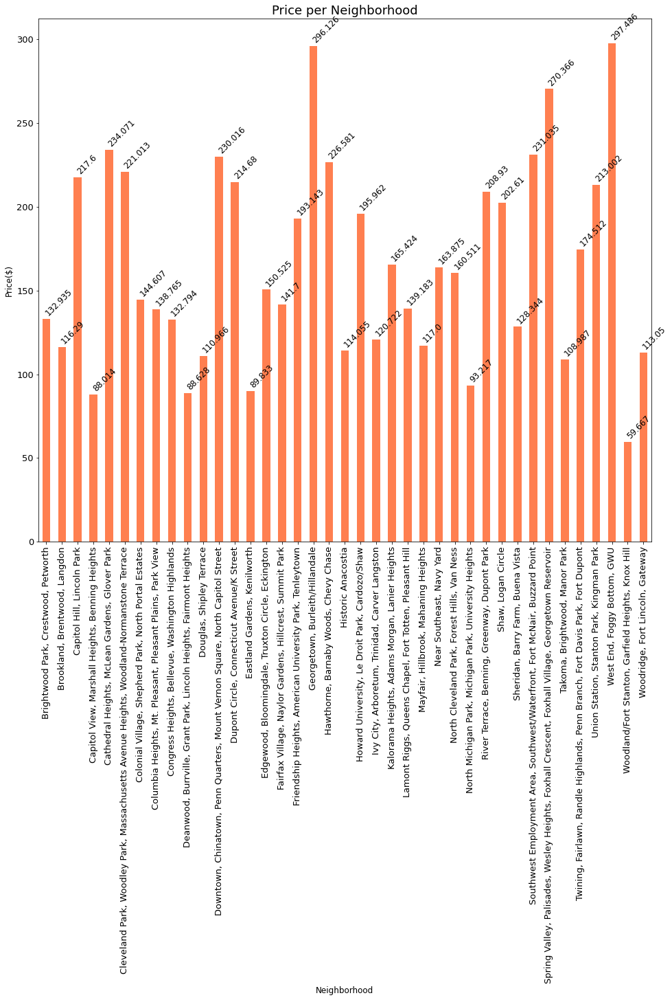

<Figure size 432x288 with 0 Axes>

In [22]:
bar_chart(abnb_dc_nbrhds_prc_mean, title="Price per Neighborhood", xlabel="Neighborhood", ylabel="Price($)", save=True, barlabel=True, barlabel_rotate=45)

Since the data was geosptailly enabled we plot the data and see where these neighborhoods area...

In [23]:
abnb_dc_geo_mean_prc_nbrhood = abnb_dc_subset_geo.groupby("NBH_NAMES")["price"].mean()
dc_nbrhds_geo_MEAN_PRC_NBRHD = dc_nbrhds_geo.merge(abnb_dc_geo_mean_prc_nbrhood, on="NBH_NAMES")

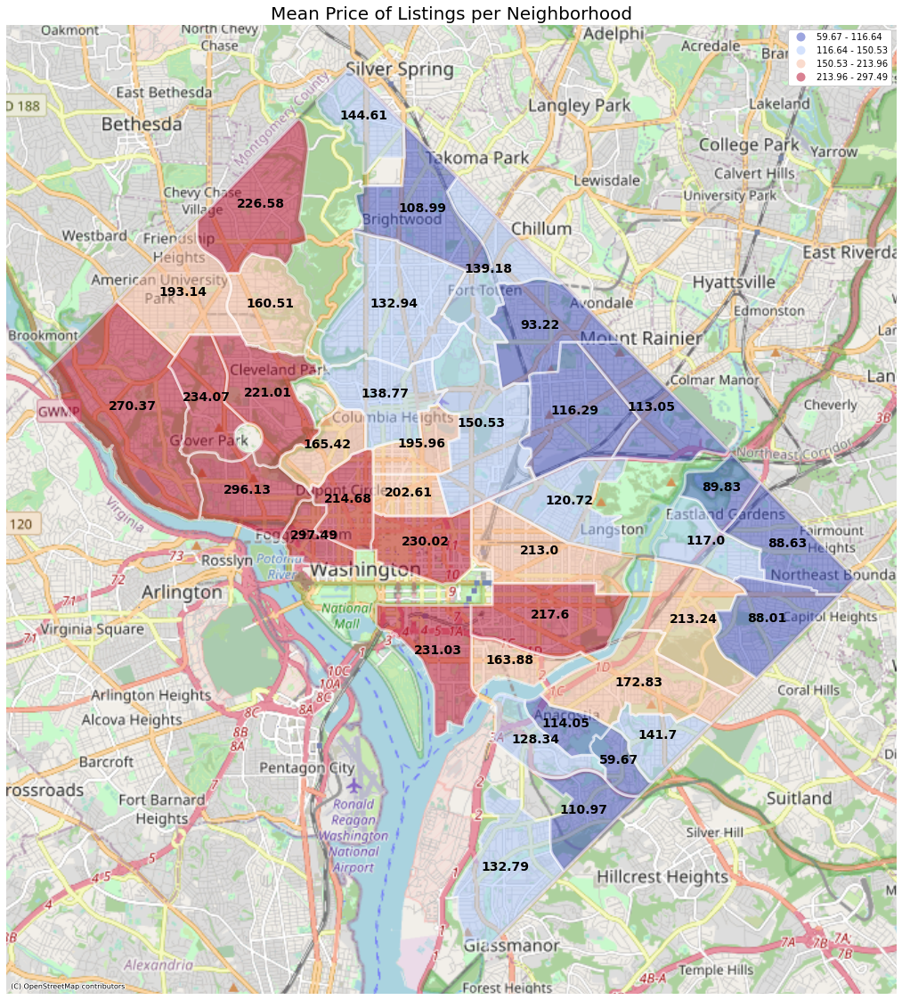

In [24]:
chor_map(gdf=dc_nbrhds_geo_MEAN_PRC_NBRHD, column='price', title='Mean Price of Listings per Neighborhood')

It looks like from the mean price West End neighborhood would the be best but lets take a closer look at the top two...

First lets look at West End, Foggy Bottom, GWU

In [25]:
westend = abnb_dc_subset_geo[abnb_dc_subset_geo['NBH_NAMES']=="West End, Foggy Bottom, GWU"]
westend[['price']].describe()

,price
count,146.000000
mean,297.486301
std,665.193653
min,40.000000
25%,109.250000
50%,156.500000
75%,209.750000
max,6000.000000


Now lets look at Georgetown, Burleith\/Hillandal...

In [26]:
georgetown = abnb_dc_subset_geo[abnb_dc_subset_geo['NBH_NAMES']=="Georgetown, Burleith/Hillandale"]
georgetown[['price']].describe()

,price
count,182.000000
mean,296.126374
std,782.011608
min,30.000000
25%,105.000000
50%,151.000000
75%,275.000000
max,10000.000000


Upon looking at the decriptive statistics from top two highest listing neighborhoods, its a difficult decision since they are both very good neighborhoods and I know that any property purchased in either area would been a wise investment.  

Now we have enough information to answer my first question:

Question 1: Which DC Neighborhood has the highest average price per listing?

1. **West End, Foggy Bottom, GWU \$297.49**
2. Georgetown, Burleith\/Hillandal \$296.13
3. Spring Valley, Palisades, 
   Wesley Heights, Foxhall Crescent, 
   Foxhall Village, Georgetown Reservoir \$270.37
4. Cathedral Heights, McLean Gardens, Glover Park \$234.07
5. Southwest Employment Area, Southwest/Waterfront, Fort McNair, Buzzard Point \$231.04

**ANSWER**: West End, Foggy Bottom, GWU neighborhood area beat out the famous Georgetown area by a few cents.  So if my client's only need was to have the highest listing possible I would point them to the Foggy Bottom to purchage a property to list on Airbnb, mainly for the reason I know the neighborhood has a Metro Station (subway) and is very close to numerous Federal offices. 

## Question 2. Which DC Neighborhood's Airbnb market is saturated?

It is very important to know how saturated a neighborhood market is with Airbnb listings before investing in a property there.  So understand this information could help a client make a more wise decision on where to invest on a property.

To perform this analysis I will `groupby` the neighborhood field and do a simple count per neighborhood... but I would also like to see the average price so I can have a better undertanding...

In [27]:
abnb_dc_subset_geo_COUNT_MEAN_PRICE = abnb_dc_subset_geo.groupby('NBH_NAMES')['price'].agg(id='count', price='mean').round(4)
abnb_dc_subset_geo_COUNT_MEAN_PRICE.sort_values(by=['id', 'price'],ascending=True)

,id,price
NBH_NAMES,,
"Woodland/Fort Stanton, Garfield Heights, Knox Hill",6,59.6667
"Eastland Gardens, Kenilworth",18,89.8333
"Fairfax Village, Naylor Gardens, Hillcrest, Summit Park",20,141.7000
"Colonial Village, Shepherd Park, North Portal Estates",28,144.6071
"Douglas, Shipley Terrace",29,110.9655
"Sheridan, Barry Farm, Buena Vista",32,128.3438
"Woodridge, Fort Lincoln, Gateway",40,113.0500
"Mayfair, Hillbrook, Mahaning Heights",42,117.0000
"River Terrace, Benning, Greenway, Dupont Park",42,213.2381


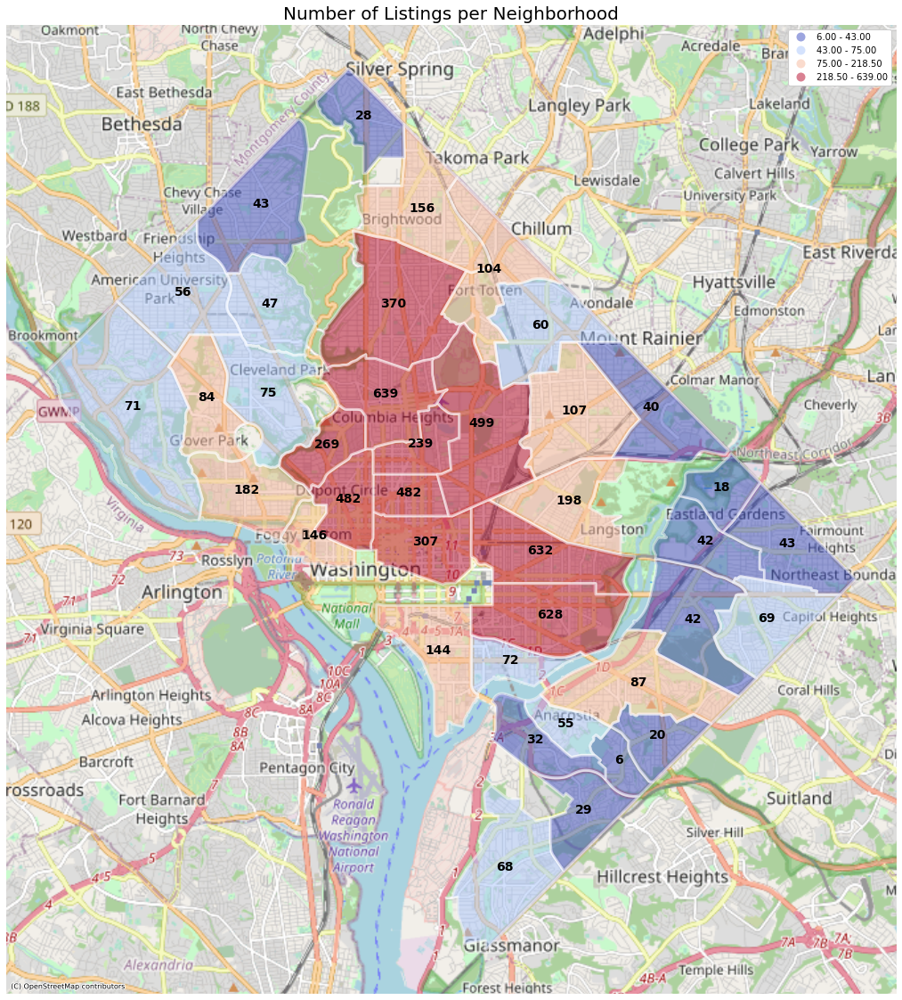

In [28]:
dc_nbrhds_geo_NUM_LSTNG_NBRHD = dc_nbrhds_geo.merge(abnb_dc_subset_geo_COUNT_MEAN_PRICE, on="NBH_NAMES")
chor_map(gdf=dc_nbrhds_geo_NUM_LSTNG_NBRHD, column='id', title='Number of Listings per Neighborhood')

From the above map, there is a a very big cluster from Capitol Hill into centeral DC heading north to the Maryland board. I would not advise my client to invest in any of these neighborhoods since there is so many properties being listed in these locations.  Once agian we See that our West End and Georgetown neighborhoods are not looking that bad, 146 ande 182 listings respectivly.  On the hand let us look at one of the neighborhoods not far from these high listing price locations... Cleveland Park, Woodley Park, Massachusetts Avenue Heights, Woodland-Normanstone Terrace....

In [29]:
clevelandpark = abnb_dc_subset_geo[(abnb_dc_subset_geo['NBH_NAMES']=="Cleveland Park, Woodley Park, Massachusetts Avenue Heights, Woodland-Normanstone Terrace") ]
print(f"Cleveland Park: \n{clevelandpark[['price']].describe()}" +"\n\n" + f"West End: \n {westend[['price']].describe()}" +"\n\n" + f"Georgetown: \n {georgetown[['price']].describe()}")

Cleveland Park: 
             price
count    75.000000
mean    221.013333
std     287.237189
min      40.000000
25%      80.000000
50%     112.000000
75%     214.500000
max    1900.000000

West End: 
              price
count   146.000000
mean    297.486301
std     665.193653
min      40.000000
25%     109.250000
50%     156.500000
75%     209.750000
max    6000.000000

Georgetown: 
               price
count    182.000000
mean     296.126374
std      782.011608
min       30.000000
25%      105.000000
50%      151.000000
75%      275.000000
max    10000.000000


The Cleveland Park area is roughly the same size (per spatial area) as the Georgetown neighborhood and it has only 75 listings at the time of the analysis.  Additionally, the mean price isn't too much lower than the top listing neighborhood of West End, the total differce is only \-$76.48.  I would argue that West End area is much more saturated with listing since it covers such a small geographic area, and the Cleveland Park area also has several Metro stops.  


Question 2. Which DC Neighborhood's Airbnb market is saturated?

1. Columbia Heights, Mt. Pleasant, Pleasant Plains, Park View	639
2. Union Station, Stanton Park, Kingman Park	632
3. Capitol Hill, Lincoln Park	628	
4. Edgewood, Bloomingdale, Truxton Circle, Eckington	499	
5. Dupont Circle, Connecticut Avenue/K Street	482	


**ANSWER**: I would advise my client to not invest in any of the above areas since they are highly saturated with Airbnb listings.  Addition, with this information I would update my recommendataion to look at West End, Georgetown and Cleveland Park areas.  From the analysis it appears that these areas would provide my client with some of the highest returns on their investments.  I decided to include the Cleveland Park area based on the fact that it has Metro access, National Zoo and has nearly the lest numbers of list with a high mean listing price.

## Question 3. How well does the data predict Airbnb Listing Price? (MODELING)

So I have shown that we can decern some information from the data obtained from Inside Airbnb, but we need to know how well this dataset can be used to predict Airbnb listing price.

To do this I will create a simple Linear Regression model. I know that my `dependent` variable is `price` but I need to decide what my `independent` variables will be in my model.

In [30]:
abnb_dc_subset_geo.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 6671 entries, 0 to 6159
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   id                      6671 non-null   int64   
 1   neighbourhood_cleansed  6671 non-null   object  
 2   latitude                6671 non-null   float64 
 3   longitude               6671 non-null   float64 
 4   property_type           6671 non-null   object  
 5   room_type               6671 non-null   object  
 6   accommodates            6671 non-null   int64   
 7   bathrooms               6671 non-null   float64 
 8   bedrooms                6671 non-null   float64 
 9   beds                    6671 non-null   float64 
 10  price                   6671 non-null   float64 
 11  minimum_nights          6671 non-null   int64   
 12  maximum_nights          6671 non-null   int64   
 13  number_of_reviews       6671 non-null   int64   
 14  geometry        

From the above list of columns, I believe that I will utilize `['room_type','accommodates','bathrooms','bedrooms','beds','number_of_reviews']` as my `independent` variables.  And since one of these variables is a catagorical field I will need to utilize Pandas fucntion for setting them a `dummy` fields (using `pd.get_dummies`), basically creating a new field for every possible option in the `room_type` column.

For typical Regression Model the dependent variable will be `y` and the indepented variables will be `X`

In [31]:
X = abnb_dc_subset_geo[['room_type','accommodates','bathrooms','bedrooms','beds','number_of_reviews']]
X = pd.get_dummies(data=X, drop_first=True)
y = abnb_dc_subset_geo[['price']]
X.head()

,accommodates,bathrooms,bedrooms,beds,number_of_reviews,room_type_Hotel room,room_type_Private room,room_type_Shared room
0,1,1.0,1.0,1.0,73,0,1,0
39,2,1.0,1.0,1.0,38,0,1,0
78,2,2.0,1.0,1.0,103,0,1,0
107,2,1.0,1.0,1.0,11,0,1,0
164,1,1.0,1.0,1.0,36,0,1,0


As you can see the column `room_type` is replaced with 3 new columns which represents every catagory precent in the `room_type` column.

Now I will set my `X` and `y` train and test sets with a split of `0.3`

In [32]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

Ensure the train/test variable shapes are correct...

In [33]:
print(f"X train shape: {X_train.shape}")
print(f"X test shape: {X_test.shape}")
print(f"y train shape: {y_train.shape}")
print(f"y test shape: {y_test.shape}")

X train shape: (4669, 8)
X test shape: (2002, 8)
y train shape: (4669, 1)
y test shape: (2002, 1)


Now I will set the model type and train my model...

/Users/njackson/anaconda3/envs/dsnd/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


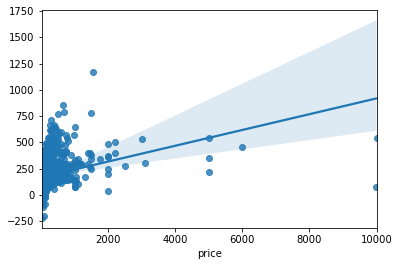

In [34]:
model = LinearRegression()
model.fit(X_train,y_train)
predictions = model.predict(X_test)
sns.regplot(y_test,predictions);

Now that our model is trained lets visualize Regression Model Statistical Results...

In [35]:
X_train_Sm= sm.add_constant(X_train)
ls=sm.OLS(y_train,X_train_Sm).fit()
print(ls.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.167
Model:                            OLS   Adj. R-squared:                  0.165
Method:                 Least Squares   F-statistic:                     116.5
Date:                Sun, 04 Apr 2021   Prob (F-statistic):          3.07e-178
Time:                        01:27:21   Log-Likelihood:                -32436.
No. Observations:                4669   AIC:                         6.489e+04
Df Residuals:                    4660   BIC:                         6.495e+04
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     27

From the output Regression Results we can see that our model is not performing very well.  The Adjusted R-squard if only `0.165`, and if seems that some of our `independent` variables might have high correlation (multicollinearity warning).  We can test this possible correlation with a quick heatmap...

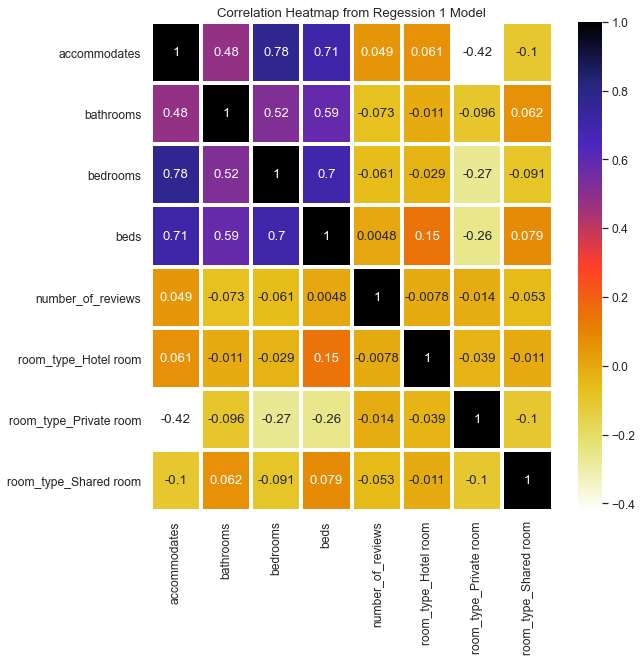

In [36]:
sns.set(font_scale=1.1)
fig, ax = plt.subplots(figsize=(9,9))# Sample figsize in inches
# ax.set_xlabel()
ax.set_title("Correlation Heatmap from Regession 1 Model")
sns.heatmap(X.corr(),annot=True,lw=3,cmap="CMRmap_r", fmt='.2g', ax=ax)
fig.savefig("x2_corr_heatmap.png",bbox_inches='tight')

The closer that cell of the heatmap is to -1 or 1 shows a high correlation between the two `independent` variables.  Thus, I will remove a few of these variables and see if our model improves.

I will perform all the same functions that I performed in the first Regression model to ensure we do not introduce any other issues in our second Regression Model...

In [37]:
X1 = abnb_dc_subset_geo[[ 'room_type','bedrooms','number_of_reviews']]
X1 = pd.get_dummies(data=X1, drop_first=True)
y1 = abnb_dc_subset_geo[['price']]
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.3, random_state=42)

In [38]:
print(f"X train shape: {X1_train.shape}")
print(f"X test shape: {X1_test.shape}")
print(f"y train shape: {y1_train.shape}")
print(f"y test shape: {y1_test.shape}")

X train shape: (4669, 5)
X test shape: (2002, 5)
y train shape: (4669, 1)
y test shape: (2002, 1)


/Users/njackson/anaconda3/envs/dsnd/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


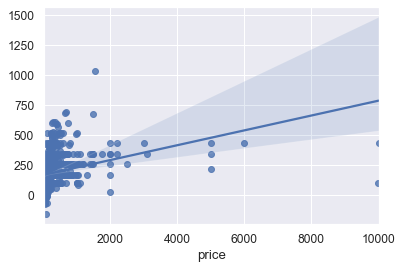

In [39]:
model = LinearRegression()
model.fit(X1_train,y1_train)
predictions = model.predict(X1_test)
sns.regplot(y1_test,predictions);

In [40]:
X1_train_Sm= sm.add_constant(X1_train)
ls=sm.OLS(y1_train,X1_train_Sm).fit()
print(ls.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.141
Model:                            OLS   Adj. R-squared:                  0.140
Method:                 Least Squares   F-statistic:                     153.1
Date:                Sun, 04 Apr 2021   Prob (F-statistic):          5.65e-151
Time:                        01:27:25   Log-Likelihood:                -32506.
No. Observations:                4669   AIC:                         6.502e+04
Df Residuals:                    4663   BIC:                         6.506e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     83

Well. Our model didn't improve, it performed worse at an Adjusted R-squarted of `0.140`, and we are still receiving the warning of possibe multicollinearity.  

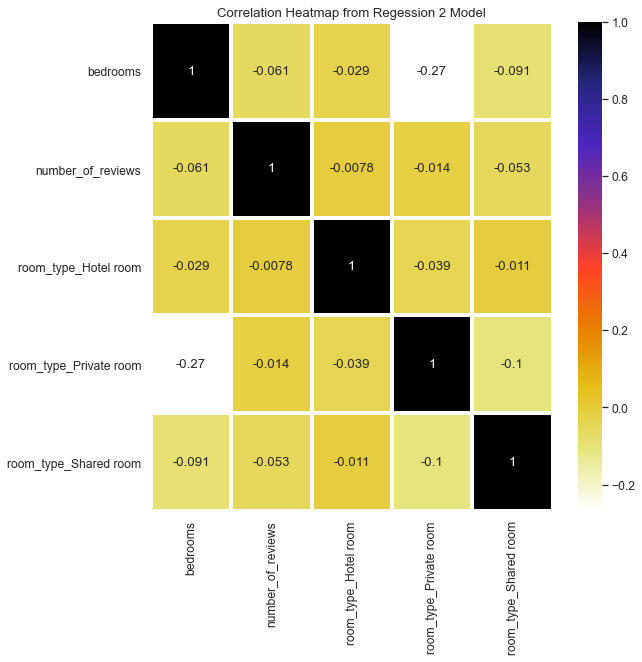

In [41]:
sns.set(font_scale=1.1)
fig, ax = plt.subplots(figsize=(9,9))# Sample figsize in inches
# ax.set_xlabel()
ax.set_title("Correlation Heatmap from Regession 2 Model")
sns.heatmap(X1.corr(),annot=True,lw=3,cmap="CMRmap_r", fmt='.2g', ax=ax)
fig.savefig("x4_corr_heatmap.png",bbox_inches='tight')

## Question 3. How well does the data predict Airbnb Listing Price?

**ANSWER**: Not well at all.  It seems that our dataset isn't the best predictor for Airbnb listing price, so we should think more about what additional datasets could be utilized in this model so that we could build a better model.

## Question 4. Are there any other factors that I need to review before investing in a property?


From our Regression model is appears that our Inside Airbnb dataset is not, solely, a good predictor of Airbnb prices in Washington, DC.  Since we are discovering this I believe that I would need to include some additional data to build a better predicting model for a client.

**ANSWER:**  Some of the addition datasets that I should consider including are the following:

* Crime Data - I believe that crime data could be a good independent variable to include within my Regression model.  
* Public Transportation - Including the ease of access to Public Transportation (i.e. Metro/Bus Systems) could be a good predictor of price.  
* Real Estate Value - Including housing price/rental price could also help in building a better predictive model for Airbnb listing price.

I believe that the above datasets would be a logical next set in building a better predictive model for a client to help them locate a location to invest in an Airbnb property.

# Section 3. Evaluation

## Q1. Which DC Neighborhood has the highest average price per listing?

1. **West End, Foggy Bottom, GWU \$297.49**
2. Georgetown, Burleith\/Hillandal \$296.13
3. Spring Valley, Palisades, 
   Wesley Heights, Foxhall Crescent, 
   Foxhall Village, Georgetown Reservoir \$270.37
4. Cathedral Heights, McLean Gardens, Glover Park \$234.07
5. Southwest Employment Area, Southwest/Waterfront, Fort McNair, Buzzard Point \$231.04

**ANSWER**: West End, Foggy Bottom, GWU neighborhood area beat out the famous Georgetown area by a few cents.  So if my client's only need was to have the highest listing possible I would point them to the Foggy Bottom to purchage a property to list on Airbnb, mainly for the reason I know the neighborhood has a Metro Station (subway) and is very close to numerous Federal offices. 

## Q2. Which DC Neighborhood's Airbnb market is saturated?

1. Columbia Heights, Mt. Pleasant, Pleasant Plains, Park View	639
2. Union Station, Stanton Park, Kingman Park	632
3. Capitol Hill, Lincoln Park	628	
4. Edgewood, Bloomingdale, Truxton Circle, Eckington	499	
5. Dupont Circle, Connecticut Avenue/K Street	482	


**ANSWER**: I would advise my client to not invest in any of the above areas since they are highly saturated with Airbnb listings.  Addition, with this information I would update my recommendataion to look at West End, Georgetown and Cleveland Park areas.  From the analysis it appears that these areas would provide my client with some of the highest returns on their investments.  I decided to include the Cleveland Park area based on the fact that it has Metro access, National Zoo and has nearly the lest numbers of list with a high mean listing price.

## Q3. How well does the data predict Airbnb Listing Price?

**ANSWER**: Not well at all.  It seems that our dataset isn't the best predictor for Airbnb listing price, so we should think more about what additional datasets could be utilized in this model so that we could build a better model.

## Q4. Are there any other factors that I need to review before investing in a property?

**ANSWER:**  Some of the addition datasets that I should consider including are the following:

* Crime Data - I believe that crime data could be a good independent variable to include within my Regression model.  
* Public Transportation - Including the ease of access to Public Transportation (i.e. Metro/Bus Systems) could be a good predictor of price.  
* Real Estate Value - Including housing price/rental price could also help in building a better predictive model for Airbnb listing price.

I believe that the above datasets would be a logical next set in building a better predictive model for a client to help them locate a location to invest in an Airbnb property.